In [1]:
%cd ..

/workspaces/apartements


In [2]:
import pandas as pd
import numpy as np

pd.options.plotting.backend = "plotly"

In [3]:
df = pd.read_csv("assets/data/bolig.csv.gzip", compression="gzip", parse_dates=["soldDate"])
df.sample(4)

,estateId,address,zipCode,price,soldDate,propertyType,saleType,sqmPrice,rooms,size,...,change,guid,latitude,longitude,municipalityCode,estateCode,city,groupKey,canGetVR,bfEnr
70466,954138,"Teglholmsgade 6C, 2. tv",2450,2800000,2014-05-28 22:00:00+00:00,3,Alm. Salg,29166.6660,4.0,96,...,-3.381642,6D71BFDD-7E1F-42D5-B421-638E6295B59D,55.652657,12.544573,101,765580,København SV,NaN,True,120958
96961,0,"Hyltebjerg Allé 34B, st. th",2720,5900000,1995-01-05 23:00:00+00:00,3,Alm. Salg,83098.5900,3.0,71,...,0.000000,FFA1697E-673B-48D0-95C3-599C34B83F5E,55.683205,12.482760,101,249867,Vanløse,2.0,True,6033253
97876,0,"Østbanegade 5, 4. tv",2100,331137,1994-01-03 23:00:00+00:00,3,Alm. Salg,1982.8563,5.0,167,...,0.000000,F9B3B44B-1C94-4ECD-B4AC-D8D4A970D346,55.693375,12.587469,101,838668,København Ø,NaN,True,102125
75090,788072,"Torben Oxes Allé 3, 1",2300,2220000,2012-11-07 23:00:00+00:00,3,Alm. Salg,32173.9120,3.0,69,...,-3.267974,AFB54E4B-EDE0-4481-91C5-97381F3CD794,55.656967,12.605957,101,575845,København S,2.0,True,6011845


In [4]:
df.columns

Index(['estateId', 'address', 'zipCode', 'price', 'soldDate', 'propertyType',
       'saleType', 'sqmPrice', 'rooms', 'size', 'buildYear', 'change', 'guid',
       'latitude', 'longitude', 'municipalityCode', 'estateCode', 'city',
       'groupKey', 'canGetVR', 'bfEnr'],
      dtype='object')

In [5]:
# Sorting fam_salg away
SALES_TYPE = "Alm. Salg"
# Sorting apartments away that where sold for under 500.000 and above 9.000.000
LOWER_PRICE, HIGHER_PRICE = 450_000, 9_500_000

# Sorting apartments away that have above 5 roomes doe to the likelyhood of it being under 0.001%procent
NUMBER_OF_ROOMS = 5

# Number of Days from Max Date
DAYS_FROM_MAX_DATE = 31 + 30 + 31 + 30


alm_salg_df = (
    df.loc[
        (df["saleType"].eq(SALES_TYPE))
        & (df["price"].between(LOWER_PRICE, HIGHER_PRICE))
        & (df["rooms"].le(NUMBER_OF_ROOMS))
    ]
    .assign(
        floor=lambda d: d["address"]
        .str.extract(r",\s*(?P<floor>\d+|st)(?=\s*[a-z]*\.?\s|$)")
        .replace("st", 0)
        .fillna(0)
        .astype(int)
    )
#.assign(rooms = lambda d: np.where(d["rooms"].eq(6), 0, d["rooms"])) # changes room 6 to 0 which is dropped
    .assign(
        days_from_latest=lambda d: (d["soldDate"].max() - d["soldDate"]).dt.days
    )
    .sort_values(by="soldDate")
    .loc[lambda d: d["days_from_latest"] <= DAYS_FROM_MAX_DATE ]
)

(alm_salg_df
  .sample(5)
  .loc[:, ["price", "rooms", "size", "soldDate"]]
  .assign(soldAge = lambda d: (d["soldDate"].dt.date - pd.to_datetime("1991-01-01")).dt.days/365)
  .loc[:,["price", "rooms", "size", "soldAge"]] 
)

In [6]:
alm_salg_df.columns

Index(['estateId', 'address', 'zipCode', 'price', 'soldDate', 'propertyType',
       'saleType', 'sqmPrice', 'rooms', 'size', 'buildYear', 'change', 'guid',
       'latitude', 'longitude', 'municipalityCode', 'estateCode', 'city',
       'groupKey', 'canGetVR', 'bfEnr', 'floor', 'days_from_latest'],
      dtype='object')

In [7]:
from pathlib import Path
import plotly.express as px

px.set_mapbox_access_token(Path("notebooks/.mapbox_token").read_text())

In [8]:
px.scatter_mapbox(
    alm_salg_df,
    lat="latitude",
    lon="longitude",
    color="size",
    size="price",
    color_continuous_scale=px.colors.cyclical.IceFire,
    size_max=5,
    zoom=11,
    title="Normal Sales Apartments in Copenhagen",
    hover_name="address",
    hover_data=["rooms", "buildYear", "floor"],
    center=dict(
        lat=55.6861,
        lon=12.5388,
    ),
    width=1200,
    height=800,
)

In [9]:
features = [
    "address",
    "zipCode",
    "soldDate",
    "rooms",
    "floor",
    "size",
    "buildYear",
    "latitude",
    "longitude",
    "municipalityCode",
    "estateCode",
    "city",
    "price",
]



In [10]:
explore_data = alm_salg_df[features].astype(
    {
        "rooms": np.int8,
        "size": np.int16,
        "buildYear": np.int32,
        "municipalityCode": np.int32,
        "estateCode": np.int32,
        "zipCode": np.int32,
    }
)
explore_data = (
    explore_data.assign(
        soldYear=lambda d: d["soldDate"].dt.year,
        soldMonth=lambda d: d["soldDate"].dt.month,
    ).drop(columns=["address", "soldDate"])

)

In [11]:
order_columns = [
    "price",
    "size",
    "rooms",
    "floor",
    "longitude",
    "latitude",
    "buildYear",
    "soldMonth",
    "soldYear",
    "zipCode",
    "city",
]

## Middle Age Tools

In [12]:
import hiplot as hip

In [13]:
explore_data.columns[::-1]

Index(['soldMonth', 'soldYear', 'price', 'city', 'estateCode',
       'municipalityCode', 'longitude', 'latitude', 'buildYear', 'size',
       'floor', 'rooms', 'zipCode'],
      dtype='object')

In [14]:
viz = hip.Experiment.from_dataframe(explore_data[order_columns])

In [15]:
viz.display();  # soldMonth has no effect & interestubg suze of 857, I think the correct is 85.7

<IPython.core.display.Javascript object>

In [16]:
explore_data = (
    explore_data
    #.drop(columns=["address", "soldDate"])
    # after the viz, we discovered Build Year 0 and size 857?
    .loc[lambda d: (d['buildYear'].ne(0))]
)

In [17]:
alm_salg_df_filtered = pd.merge(
    alm_salg_df[["address", "soldDate"]],
    explore_data,
    how="inner",
    left_index=True,
    right_index=True,
)

In [18]:
# alm_salg_df_filtered.loc[lambda d: d["floor"].gt(24)]

In [19]:
alm_salg_df_filtered.shape

(1317, 15)

In [20]:
interesting_columns = [
    "price",
    "size",
    "rooms",
    "floor",
    "longitude",
    "latitude",
    "buildYear",
    "soldYear",
    "zipCode",
    "city",
]

In [21]:
from sklearn.model_selection import train_test_split

In [22]:
X = explore_data[
    [
        "size",
        "rooms",
        "longitude",
        "latitude",
        "buildYear",
        "floor",
        "soldYear",
        "zipCode",
        "city",
    ]
]
y = explore_data["price"]

In [23]:
train_data = X.assign(price=y)

In [24]:
train_data.columns

Index(['size', 'rooms', 'longitude', 'latitude', 'buildYear', 'floor',
       'soldYear', 'zipCode', 'city', 'price'],
      dtype='object')

In [25]:
train_data["rooms"].value_counts(normalize=False)

rooms
2    593
3    406
4    162
1     95
5     61
Name: count, dtype: int64

In [26]:
from sklearn.linear_model import LinearRegression
import patsy as ps

In [27]:
train_data.sample(2)

,size,rooms,longitude,latitude,buildYear,floor,soldYear,zipCode,city,price
18653,54,2,12.557810,55.707160,1979,6,2023,2100,København Ø,2850000
17512,58,2,12.572096,55.617283,2010,3,2023,2300,København S,2550000


In [28]:
# price ~ size

formula = (
    "price ~ size + C(rooms) + C(buildYear) + latitude + longitude - 1"
)

In [29]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter(action="ignore", category=FutureWarning)

    y_, X_ = ps.dmatrices(formula, data=train_data)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(
    X_, y_, train_size=0.9, random_state=42
)
y_train, y_test = y_train.ravel(), y_test.ravel()

In [31]:
LinearRegression(n_jobs=-1).fit(X_train, y_train).score(X_test, y_test)

0.7930641348003018

In [32]:
from sklearn.neighbors import KNeighborsRegressor

In [33]:
KNeighborsRegressor(n_jobs=-1, n_neighbors=7).fit(X_train, y_train).score(
    X_test, y_test
)

0.6808533564939792

In [34]:
from sklearn.ensemble import GradientBoostingRegressor, ExtraTreesRegressor

In [35]:
GradientBoostingRegressor(
    learning_rate=0.7,
    n_estimators=107,
    random_state=42,
).fit(
    X_train, y_train
).score(X_test, y_test)

0.863074589559821

In [36]:
ExtraTreesRegressor(n_jobs=-1, 
                    n_estimators=107,
                    random_state=42,
                   ).fit(X_train, y_train).score(
    X_test, y_test
)

0.8529191344585347

In [37]:
from flaml import AutoML

In [38]:
automl = AutoML()

In [39]:


automl_settings = {
    "time_budget": 60 * 7,  # in seconds
    "metric": "rmse",
    "task": "regression",
    "log_file_name": "bolig.log",
    "estimator_list": [
        "xgboost",
        "lgbm",
        "catboost",
        "extra_tree",
    ],
    "sample": True,
    "n_jobs": -1,
}

automl.fit(X_train=X_train, y_train=y_train, **automl_settings)

[flaml.automl.logger: 01-08 17:33:45] {1679} INFO - task = regression
[flaml.automl.logger: 01-08 17:33:45] {1690} INFO - Evaluation method: cv
[flaml.automl.logger: 01-08 17:33:45] {1788} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 01-08 17:33:45] {1900} INFO - List of ML learners in AutoML Run: ['xgboost', 'lgbm', 'catboost', 'extra_tree']
[flaml.automl.logger: 01-08 17:33:45] {2218} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 01-08 17:33:45] {2344} INFO - Estimated sufficient time budget=771s. Estimated necessary time budget=1s.
[flaml.automl.logger: 01-08 17:33:45] {2391} INFO -  at 0.1s,	estimator xgboost's best error=2958538.0271,	best estimator xgboost's best error=2958538.0271
[flaml.automl.logger: 01-08 17:33:45] {2218} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 01-08 17:33:45] {2391} INFO -  at 0.2s,	estimator lgbm's best error=1503893.5797,	best estimator lgbm's best error=1503893.5797
[flaml.automl.logger: 01-08 17:33

[flaml.automl.logger: 01-08 17:33:56] {2391} INFO -  at 10.7s,	estimator lgbm's best error=721181.8095,	best estimator lgbm's best error=721181.8095
[flaml.automl.logger: 01-08 17:33:56] {2218} INFO - iteration 50, current learner lgbm
[flaml.automl.logger: 01-08 17:33:57] {2391} INFO -  at 11.2s,	estimator lgbm's best error=721181.8095,	best estimator lgbm's best error=721181.8095
[flaml.automl.logger: 01-08 17:33:57] {2218} INFO - iteration 51, current learner lgbm
[flaml.automl.logger: 01-08 17:33:57] {2391} INFO -  at 11.7s,	estimator lgbm's best error=721181.8095,	best estimator lgbm's best error=721181.8095
[flaml.automl.logger: 01-08 17:33:57] {2218} INFO - iteration 52, current learner lgbm
[flaml.automl.logger: 01-08 17:33:57] {2391} INFO -  at 11.8s,	estimator lgbm's best error=721181.8095,	best estimator lgbm's best error=721181.8095
[flaml.automl.logger: 01-08 17:33:57] {2218} INFO - iteration 53, current learner xgboost
[flaml.automl.logger: 01-08 17:33:57] {2391} INFO -  

In [40]:
automl.score(X_test, y_test)

0.8841095611272191

In [41]:
automl.best_estimator, automl.best_config_per_estimator.get(automl.best_estimator)

('xgboost',
 {'n_estimators': 759,
  'max_leaves': 17,
  'min_child_weight': 1.0985898529515317,
  'learning_rate': 0.03245066619296888,
  'subsample': 0.6980701498823623,
  'colsample_bylevel': 0.7937544467235448,
  'colsample_bytree': 0.9097763346680299,
  'reg_alpha': 0.02540958839565814,
  'reg_lambda': 0.004781355627452111})

## End yet another

In [42]:

from sklearn.metrics import mean_squared_error, r2_score

In [43]:
%%time
y_pred = automl.predict(X_test).round(0).astype(int)
int(mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False))

CPU times: user 11.2 ms, sys: 3.93 ms, total: 15.1 ms
Wall time: 7.85 ms


529641

In [44]:
# automlx is slow in scoring

In [45]:
import pickle

In [46]:
Path("notebooks/auto.pkl").write_bytes(
    pickle.dumps(automl, pickle.HIGHEST_PROTOCOL)
)

1599394

In [47]:
predictor = pickle.loads(Path("notebooks/auto.pkl").read_bytes()).model

In [48]:
predicted_price = predictor.predict(X_test).round(0).astype(int)

In [49]:
def restore_category(df, name):
    return (
        df[df.columns[df.columns.str.startswith(f"C({name})")]]
        .idxmax(axis=1)
        .str.extract(f"\[\.|(?P<{name}>\d+)\]")
        .astype(int)
    )

In [50]:
p = (
    pd.DataFrame(X_test, columns=X_.design_info.column_names)
    .assign(
        rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
        #soldYear=lambda d: restore_category(d, name="soldYear"),
        actual_price=y_test,
        predicted_price=predicted_price,
        residual=lambda d: d["predicted_price"] - d["actual_price"],
        under_estimate=lambda d: d["residual"] < 0,
    )
    # .sort_values(by=["actual_price", "predicted_price"]
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
)

In [51]:
fig_size = {"width": 1200, "height": 400}
R2 = predictor.score(X_test, y_test).round(3)
RMSE = f"{int(mean_squared_error(y_true=y_test, y_pred=predicted_price, squared=False)):,}".replace(
    ",", "."
)


(
    p.plot(
        kind="line",
        y="actual_price",
        title=f"True Sales v/ Predicted Sales : {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        p.plot(kind="area", y="predicted_price")
        .update_traces(
            line=dict(color="black", width=2),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [52]:
(
    p.plot(
        kind="scatter",
        y="residual",
        x=p.index,
        size="size",
        size_max=15,
        title=f"True Sales - Predicted Sales: {R2=} RMSE = DKK {RMSE}",
        **fig_size,
    )
    .add_hline(
        y=0,
        opacity=0.4,
    )
    .update_traces(mode="markers")
    .update_layout(hovermode="y")
)

In [53]:
# worst 5
p.assign(residual=lambda d: abs(d["residual"])).sort_values("residual").reset_index(
    drop=True
).iloc[-5:]

,size,latitude,longitude,rooms,buildYear,actual_price,predicted_price,residual,under_estimate
127,139.0,55.659700,12.633283,4,1962,7450000.0,8706451,1256451.0,False
128,102.0,55.672170,12.532495,4,1908,7400000.0,6090894,1309106.0,True
129,95.0,55.666460,12.594339,3,2018,4675000.0,6116728,1441728.0,False
130,86.0,55.699894,12.584923,3,1960,4995000.0,6490840,1495840.0,False
131,128.0,55.665016,12.579160,4,1970,5345000.0,7519025,2174025.0,False


In [54]:
# best 5
p.assign(residual=lambda d: abs(d["residual"])).sort_values("residual").reset_index(
    drop=True
).iloc[:5]

,size,latitude,longitude,rooms,buildYear,actual_price,predicted_price,residual,under_estimate
0,39.0,55.692753,12.499410,1,1937,1470000.0,1477270,7270.0,False
1,52.0,55.686844,12.567264,2,1880,3200000.0,3191431,8569.0,True
2,50.0,55.691673,12.568008,1,1963,2450000.0,2429458,20542.0,True
3,50.0,55.707120,12.588407,1,1935,2650000.0,2621600,28400.0,True
4,92.0,55.684822,12.490923,3,1981,3900000.0,3870962,29038.0,True


In [55]:
interesting_columns = [
    "actual_price",
    "predicted_price",
    "residual",
    "under_estimate",
    "size",
    "rooms",
    "longitude",
    "latitude",
    "buildYear",
   # "soldYear",
]

# The Chart to Rule them All

In [56]:
vis = hip.Experiment.from_dataframe(p[interesting_columns])
vis.display(force_full_width=True)

<IPython.core.display.Javascript object>

In [57]:
def to_int(df):
    columns = df.columns[df.columns.str.startswith("C(")]
    df[columns] = df[columns].astype(int)
    return df


dt = (pd
  .DataFrame(X_train, columns=X_.design_info.column_names)
  .assign(price=y_train)
  .pipe(to_int)
  
)


dv = (pd
  .DataFrame(X_test, columns=X_.design_info.column_names)
  .assign(price=y_test)
  .pipe(to_int)
  
)

In [58]:
import arviz as az
import pymc as pm

In [59]:
az.style.use("arviz-doc")
az.rcParams["plot.backend"] = "matplotlib"
az.output_notebook()

Loading BokehJS ...

In [60]:
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
mpl.rcParams["figure.facecolor"] = "white"
mpl.rcParams["figure.dpi"] = 100
mpl.rcParams["axes.spines.left"] = False

FIGSIZE = (12, 5)


In [61]:
dt = (dt.assign(
    rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
     )
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
     )

dv = (dv.assign(
    rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
     )
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
)

In [62]:
dt["rooms"].value_counts()

rooms
2    526
3    370
4    148
1     84
5     57
Name: count, dtype: int64

In [63]:
import pymc as pm

In [71]:
# price ~ size + 1

with pm.Model() as model: 
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=20)
    slope = pm.Normal("slope", 0, sigma=20)

    # data
    size = pm.MutableData('size', np.log10(dt['size']), dims="obs_idx")
    log_price = np.log10(dt['price'])

    # Define likelihood
    likelihood = pm.Normal("price", mu=intercept + slope * size, sigma=sigma, observed=log_price, dims="obs_idx")

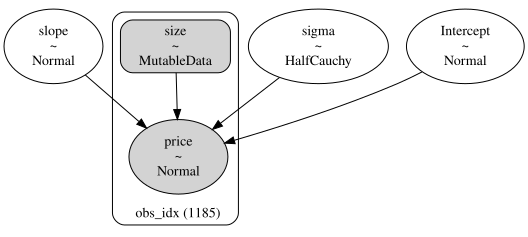

In [72]:
pm.model_to_graphviz(model)

In [73]:
likelihood

price

In [74]:
with model:
    idata = pm.sample(5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, Intercept, slope]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 58 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


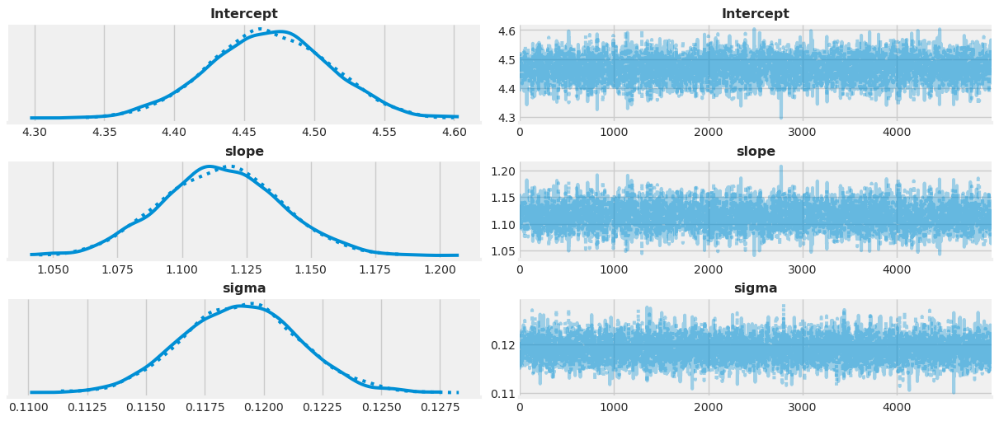

In [75]:
az.plot_trace(idata, figsize=FIGSIZE);

In [76]:
with model:
    pm.set_data({
        'size': np.log10(dv['size']),
    })
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idata, predictions=True,)

Sampling: [price]


In [77]:
columns_order = ['size', 'latitude', 'longitude', 'rooms', 'buildYear',
              'price', 'pred_price', "residual"]

In [78]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)
dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3658688.0,1386312.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3259777.0,515223.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,5089256.0,-839256.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,1970934.0,949066.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3910938.0,-1460938.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,1916832.0,83168.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5050504.0,949496.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4483055.0,-688055.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2717334.0,202666.0


In [ ]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [ ]:

(
    dv.plot(
        kind="scatter",
        y="residual",
        x=p.index,
        size="size",
        size_max=15,
        title=f"True Sales - Predicted Sales: {R2=} RMSE = DKK {RMSE}",
        **fig_size,
    )
    .add_hline(
        y=0,
        opacity=0.4,
    )
    .update_traces(mode="markers")
    .update_layout(hovermode="y")
)

In [64]:
# price ~ size + rooms + 1   Treating rooms as not categorical ( X => price ~ size + C(rooms) + 1)

with pm.Model() as modelx: 
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.HalfNormal("Intercept", sigma=20)
    
    Size = pm.Normal("Size", 0, sigma=20)
    Rooms = pm.Normal("Rooms", 0, sigma=10)

    # data
    size = pm.MutableData('size', np.log10(dt['size']), dims="obs_idx")
    rooms = pm.MutableData('rooms', dt['rooms'], dims="obs_idx")
    log_price = np.log10(dt['price'].values)
    # Define likelihood
    likelihood = pm.Normal("price", mu=intercept + Size * size + Rooms*rooms, sigma=sigma, observed=log_price, dims="obs_idx")

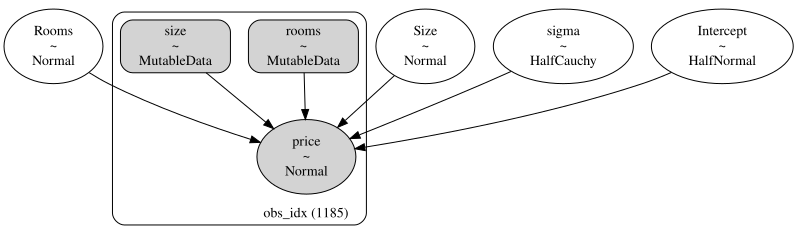

In [65]:
pm.model_to_graphviz(modelx)

In [66]:
likelihood

price

In [67]:
with modelx:
    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idatax = pm.sample(5000)
    
az.to_netcdf(idatax, 'modelx_trace.nc')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, Intercept, Size, Rooms]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 106 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


'modelx_trace.nc'

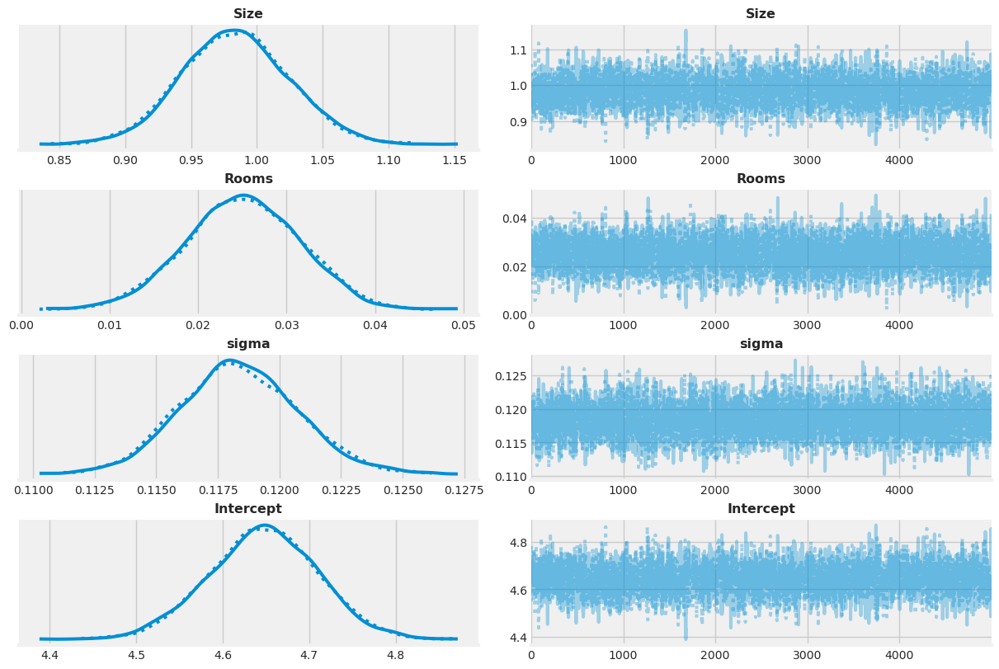

In [68]:
az.plot_trace(idatax);

In [69]:
with modelx:
    pm.set_data({
        'size': np.log10(dv['size']),
        'rooms': dv['rooms'],
    })
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idatax, predictions=True, extend_inferencedata=True)

Sampling: [price]


In [79]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)

dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3658688.0,1386312.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3259777.0,515223.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,5089256.0,-839256.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,1970934.0,949066.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3910938.0,-1460938.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,1916832.0,83168.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5050504.0,949496.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4483055.0,-688055.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2717334.0,202666.0


In [80]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [81]:
rooms, rooms_idx = np.unique(dt["rooms"], return_inverse=True)
log_price = np.log10(dt['price'])

In [82]:
coords = {"Rooms": rooms}
with pm.Model(coords=coords) as modely:

    log_price_ = pm.MutableData("log_price", log_price)
    rooms_idx_ = pm.MutableData("rooms_idx", rooms_idx)
    size = pm.MutableData("size", np.log10(dt["size"]),)
     # Define priors
    
    
    β0 = pm.Normal("β0", 0, sigma=20, dims="Rooms")
    β1 = pm.Normal("β1", 0, sigma=20, dims="Rooms")

    # sigma = pm.HalfNormal("σ", sigma=5)
    sigma = pm.HalfCauchy("σ", beta=10)


    mu = β0[rooms_idx_] + β1[rooms_idx_] * size
    
     # Define likelihood
    likelihood = pm.Normal("price", mu=mu, sigma=sigma, observed=log_price_, shape=mu.shape)

In [83]:
likelihood

price

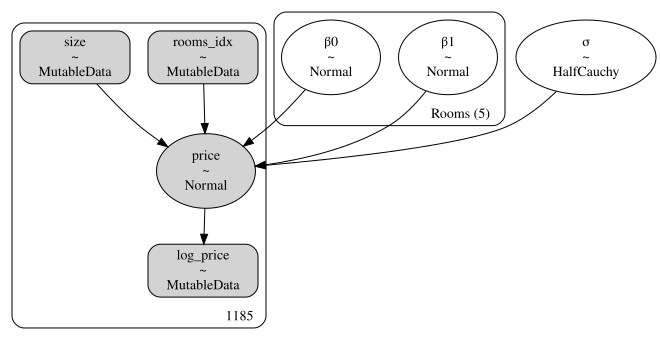

In [ ]:
pm.model_to_graphviz(modely)

In [ ]:
with modely:
    # Inference!
    # draw 5000 posterior samples using NUTS sampling
    idatay = pm.sample(5000)

    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [β0, β1, σ]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 350 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


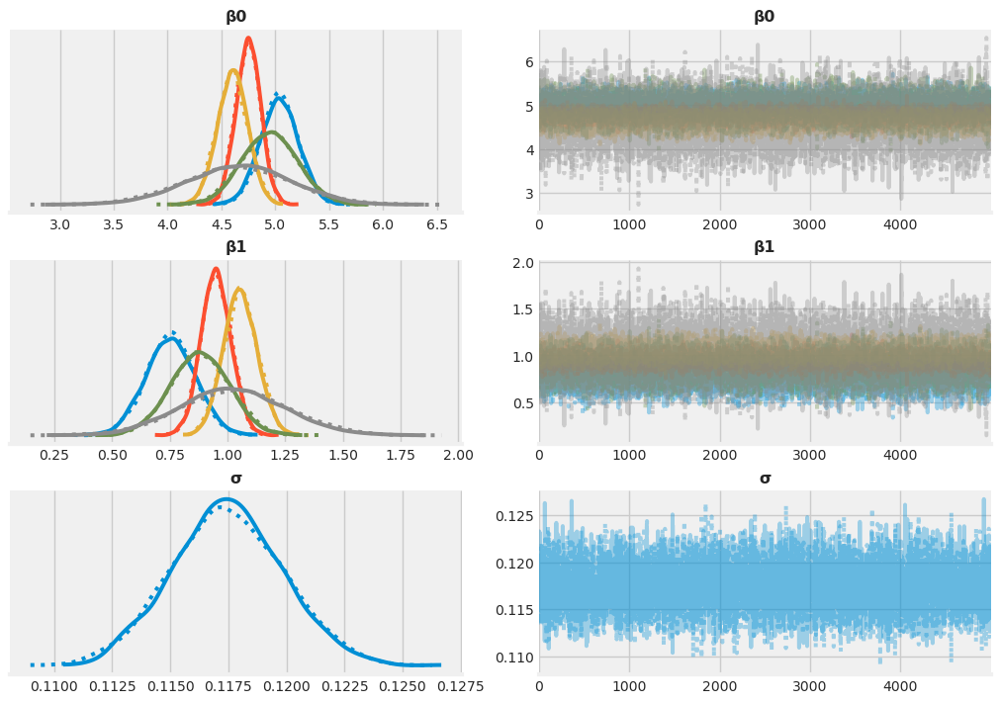

In [ ]:
az.plot_trace(idatay, figsize=(10, 7));

In [ ]:
# Map the species in the test data to the original index values from the train dataset
name_to_idx_map = {name: index for index, name in pd.Series(rooms).to_dict().items()}
rooms_idx_dv = dv["rooms"].map(name_to_idx_map).to_numpy()

In [ ]:
with modely:
    pm.set_data(
        {
            "size": np.log10(dv["size"]),
            "rooms_idx": rooms_idx_dv,
        }
    )

In [ ]:
with modely:
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idatay, predictions=True)

Sampling: [price]


In [ ]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)

dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3435482.0,1609518.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3465075.0,309925.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,5314981.0,-1064981.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,1892701.0,1027299.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3016004.0,-566004.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,1859666.0,140334.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5183458.0,816542.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4711782.0,-916782.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2672568.0,247432.0


In [ ]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

# From Predictions to Business Insights
Making decisions base on modeling

/workspaces/apartements/.conda/lib/python3.11/site-packages/arviz/plots/plot_utils.py:271: UserWarning:

rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (132) in plot_posterior, generating only 40 plots



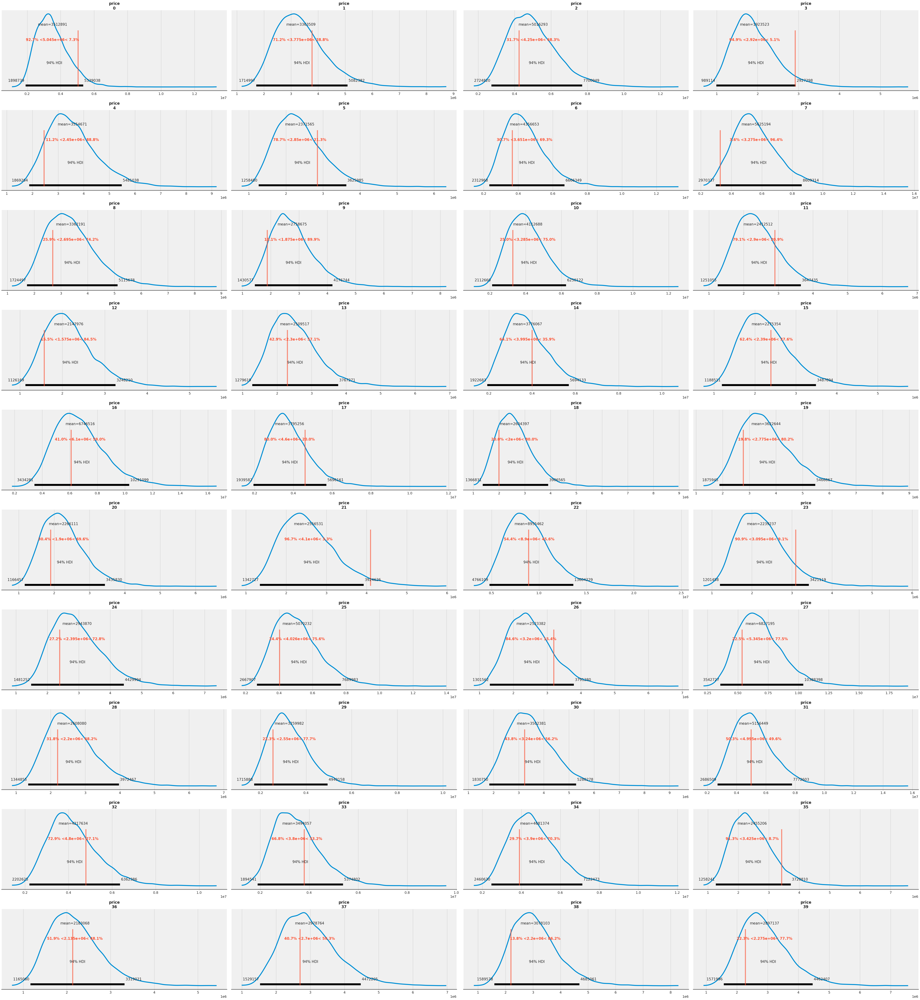

In [84]:
az.plot_posterior(
    10**idatax.predictions,
    ref_val=dv["price"].tolist(),
    transform=None,
);

In [85]:
M = 1e6
obs_idx = 13
threshold = 2.5 * M
actual_price = dv["price"].astype(int).iloc[obs_idx]
#(predictions >= threshold).mean(dim=("chain", "draw")).round(2)

In [86]:
predictions = 10**(idatax.predictions)

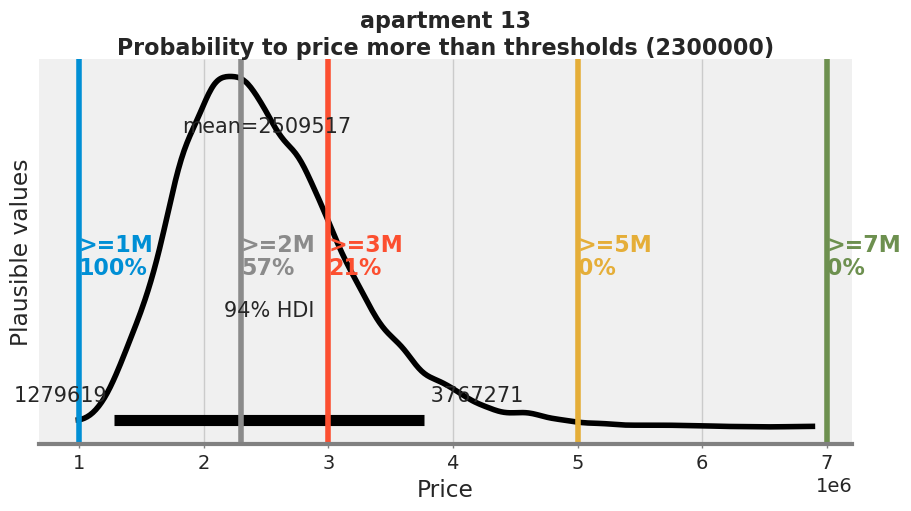

In [87]:
price_zero_predictions = predictions["price"].sel(obs_idx=obs_idx)
_, ax = plt.subplots(figsize=(9, 5))
ax = az.plot_posterior(price_zero_predictions, color="k", ax=ax)

for k, threshold in enumerate(np.array([1, 3, 5, 7, actual_price/M])*M):
    probs_above_threshold = (price_zero_predictions >= threshold).mean(dim=("chain", "draw"))

    ax.axvline(threshold, color=f"C{k}")
    _, pdf = az.kde(price_zero_predictions.stack(sample=("chain", "draw")).data)
    ax.text(
        x=threshold - 35,
        y=pdf.max() / 2,
        s=f">={threshold/M:.0f}M",
        color=f"C{k}",
        fontsize="16",
        fontweight="bold",
    )
    ax.text(
        x=threshold - 20,
        y=pdf.max() / 2.3,
        s=f"{probs_above_threshold.data:.0%}",
        color=f"C{k}",
        fontsize="16",
        fontweight="bold",
    )
    ax.set_title(f"apartment {obs_idx}\nProbability to price more than thresholds ({actual_price})", fontsize=16)
    ax.set(xlabel="Price", ylabel="Plausible values")

/workspaces/apartements/.conda/lib/python3.11/site-packages/arviz/plots/plot_utils.py:271: UserWarning:

rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (132) in plot_posterior, generating only 40 plots



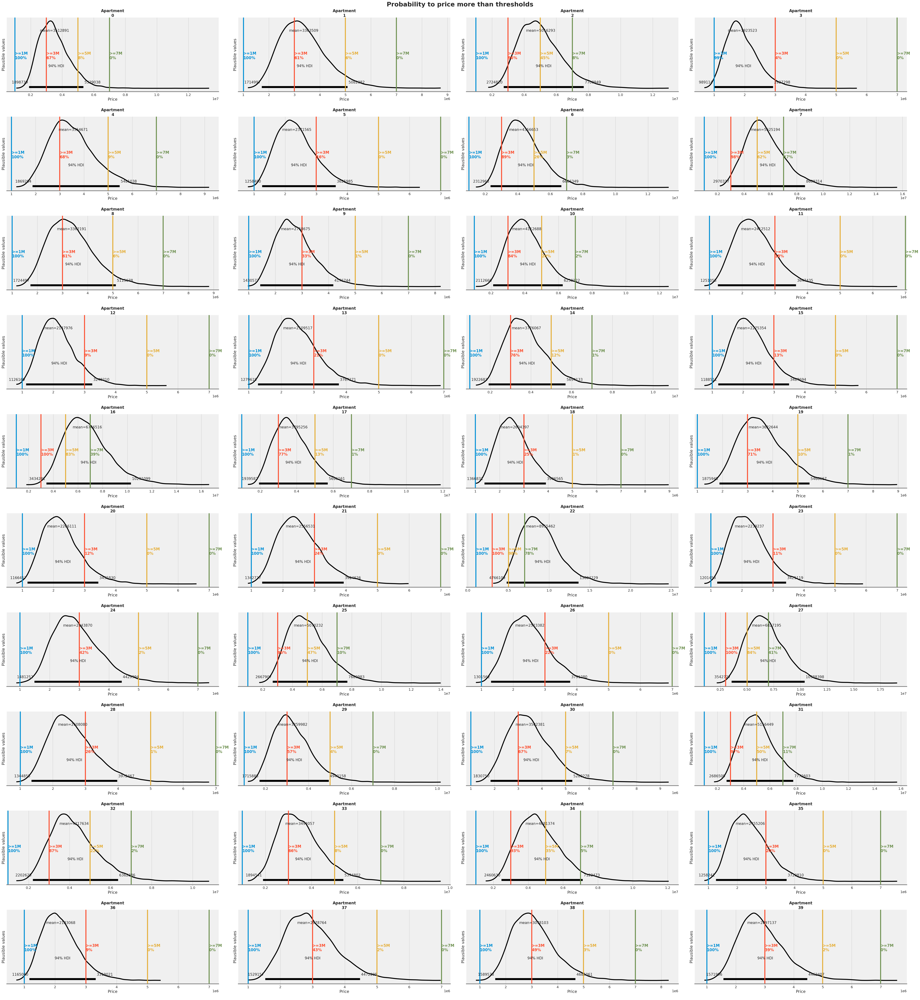

In [88]:
axes = az.plot_posterior(predictions, color="k")

for k, threshold in enumerate(np.array([1, 3, 5, 7])*M):
    probs_above_threshold = (predictions >= threshold).mean(dim=("chain", "draw"))
    
    for i, ax in enumerate(axes.ravel()):
        ax.axvline(threshold, color=f"C{k}")
        _, pdf = az.kde(predictions["price"].sel(obs_idx=i).stack(sample=("chain", "draw")).data)
        ax.text(
            x=threshold - 35,
            y=pdf.max() / 2,
            s=f">={threshold/M:.0f}M",
            color=f"C{k}",
            fontsize="16",
            fontweight="bold",
        )
        ax.text(
            x=threshold - 20,
            y=pdf.max() / 2.3,
            s=f"{probs_above_threshold.sel(obs_idx=i)['price'].data :.0%}",
            color=f"C{k}",
            fontsize="16",
            fontweight="bold",
        )
        ax.set_title(f"Apartment\n{i}", fontsize=16)
        ax.set(xlabel="Price\n", ylabel="Plausible values")
plt.suptitle("Probability to price more than thresholds", fontsize=26, fontweight="bold");

# All features

In [ ]:
dv["price"].head()

In [ ]:
# price ~ size + rooms + latitude + logitude + 1    

with pm.Model() as model: 
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.HalfNormal("Intercept", sigma=20)
    
    Size = pm.Normal("Size", 0, sigma=20)
    Rooms = pm.Normal("Rooms", 0, sigma=20)

    Latitude = pm.Normal("Latitude", 0, sigma=20)
    Longitude = pm.Normal("Longitude", 0, sigma=20)

    # data
    size = pm.MutableData('size', np.log10(dt['size']), dims="obs_idx")
    rooms = pm.MutableData('rooms', dt['rooms'], dims="obs_idx")
    latitude = pm.MutableData('latitude', np.log10(dt['latitude']), dims="obs_idx")
    longitude = pm.MutableData('longitude', np.log10(dt['longitude']), dims="obs_idx")

    
    log_price = np.log10(dt['price'].values)
    # Define likelihood
    likelihood = pm.Normal("price", mu=intercept + Size * size + Rooms*rooms + Latitude*latitude + Longitude*longitude, sigma=sigma, observed=log_price, dims="obs_idx")

    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idata = pm.sample(5000)

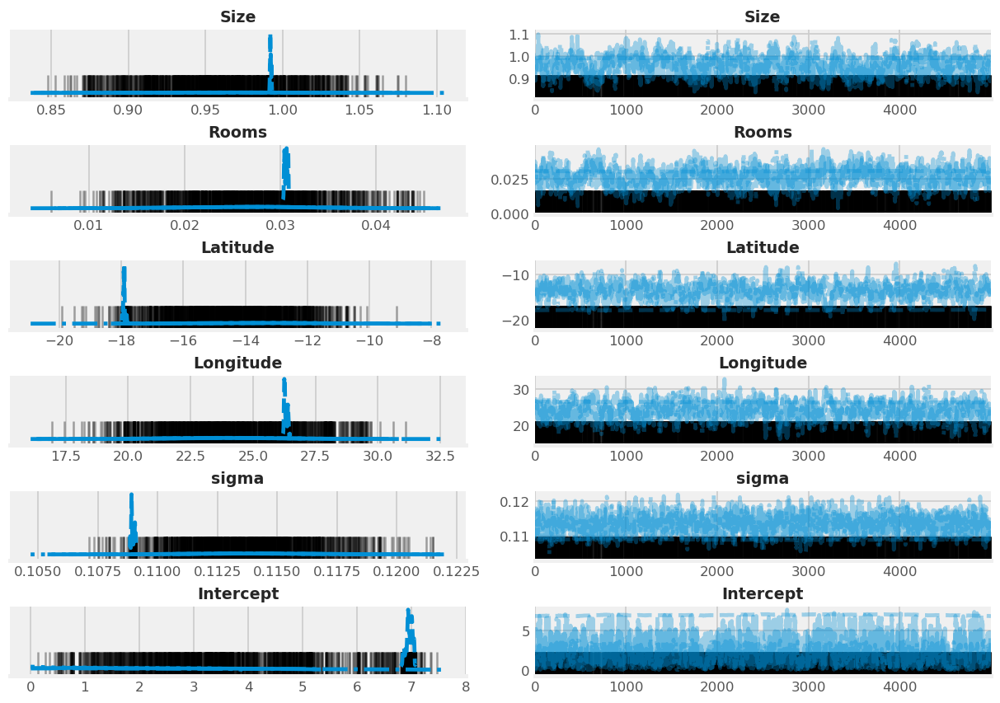

In [ ]:
az.plot_trace(idata, figsize=(10, 7));

In [ ]:
with model:
    pm.set_data({
        'size': np.log10(dv['size']),
        'rooms': dv['rooms'],
        'latitude': np.log10(dv['latitude']),
        'longitude': np.log10(dv['longitude']),
    })
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idata, predictions=True)

Sampling: [price]


In [ ]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)

dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3683902.0,1361098.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3232650.0,542350.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,4550587.0,-300587.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,1939578.0,980422.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3077329.0,-627329.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,2081440.0,-81440.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5415067.0,584933.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4536137.0,-741137.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2733299.0,186701.0


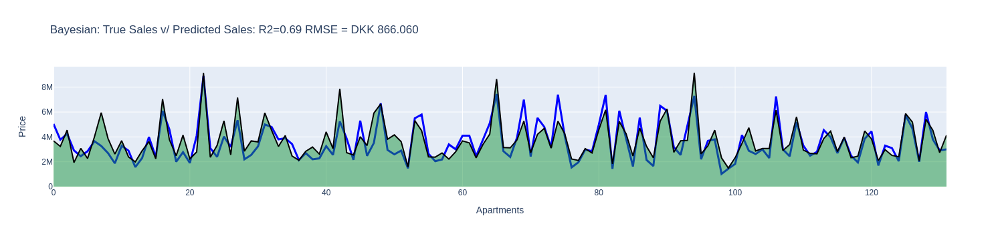

In [ ]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [ ]:
#fig = _
#fig.write_html("assets/example.html", full_html=True, include_plotlyjs='cdn')

# all features end